-----------------


In [1]:
!pip install albumentations


In [2]:
%%capture
!pip install ultralytics
# !pip install albumentations

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import glob
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
import torch
import seaborn as sns
from PIL import Image
from IPython.display import display, Video
from ultralytics import YOLO
from collections import deque
import subprocess  # For executing ffmpeg

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# Define dataset paths
train_dir = "/kaggle/input/license-plate-dataset/archive/images/train"
val_dir = "/kaggle/input/license-plate-dataset/archive/images/val"

# Define class names
classes = ["license_plate"]  # Add more classes if needed

# Create YAML content
data_yaml_content = f"""
train: {train_dir}
val: {val_dir}

nc: {len(classes)}  # Number of classes
names: {classes}  # Class names
"""

# Save to a file
yaml_path = "/kaggle/working/data.yaml"
with open(yaml_path, "w") as f:
    f.write(data_yaml_content)

# Display the content for verification
!cat {yaml_path}



train: /kaggle/input/license-plate-dataset/archive/images/train
val: /kaggle/input/license-plate-dataset/archive/images/val

nc: 1  # Number of classes
names: ['license_plate']  # Class names


In [5]:
model = YOLO("yolov8n.pt")

In [6]:
results = model.train(
    data="/kaggle/working/data.yaml",
    epochs=50,  
    imgsz=640, 
    lr0= 0.0005,  
    batch=32,
    lrf=0.1,
    augment=True
)

Ultralytics 8.3.174 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, p

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 9.0±5.1 MB/s, size: 24.6 KB)


train: Scanning /kaggle/input/license-plate-dataset/archive/labels/train... 1525 images, 0 backgrounds, 1 corrupt: 100%|██████████| 1526/1526 [00:04<00:00, 321.15it/s]

train: /kaggle/input/license-plate-dataset/archive/images/train/car-wbs-MH03AR5549_00000.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/license-plate-dataset/archive/images/train/car-wbs-MH03AR5549_00000.jpg'


WARNING ⚠️ train: Cache directory /kaggle/input/license-plate-dataset/archive/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 24.5±23.1 MB/s, size: 162.0 KB)


val: Scanning /kaggle/input/license-plate-dataset/archive/labels/val... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 217.42it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/license-plate-dataset/archive/labels is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.74G      1.051      2.188      1.095         44        640: 100%|██████████| 48/48 [00:16<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.53it/s]

                   all        169        169          1      0.109      0.615      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.54G     0.9371      1.139     0.9838         33        640: 100%|██████████| 48/48 [00:15<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.33it/s]

                   all        169        169     0.0497      0.284     0.0495     0.0383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.54G      0.924     0.8878     0.9914         39        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]

                   all        169        169      0.899       0.84      0.911      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.54G     0.9241     0.8005     0.9893         51        640: 100%|██████████| 48/48 [00:15<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]

                   all        169        169      0.979      0.917      0.984       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.54G      0.908     0.6883     0.9752         34        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        169        169       0.97      0.947      0.989      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.54G     0.8646     0.6423     0.9612         34        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all        169        169      0.952      0.953      0.976      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.54G     0.8357     0.6162     0.9785         45        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        169        169      0.926      0.964      0.983      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.54G     0.8467     0.5888     0.9633         40        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        169        169      0.947      0.976      0.989      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.54G      0.811     0.5503     0.9528         37        640: 100%|██████████| 48/48 [00:15<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        169        169      0.982      0.973      0.992      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.54G     0.7913     0.5267     0.9388         41        640: 100%|██████████| 48/48 [00:15<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all        169        169      0.968      0.908      0.971      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.54G     0.7782     0.5188     0.9374         46        640: 100%|██████████| 48/48 [00:15<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.56it/s]

                   all        169        169      0.974       0.97      0.988      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.54G     0.7706     0.4997     0.9328         42        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all        169        169      0.987      0.982      0.988       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.54G     0.7743     0.5017     0.9407         41        640: 100%|██████████| 48/48 [00:15<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all        169        169      0.993      0.982      0.994      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.54G     0.7463     0.4897     0.9307         46        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all        169        169      0.992      0.994      0.994      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.54G     0.7568     0.4887     0.9299         36        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        169        169      0.987      0.925      0.986       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.54G     0.7359     0.4573     0.9223         45        640: 100%|██████████| 48/48 [00:15<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all        169        169      0.954      0.989       0.99      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.54G     0.7403      0.477     0.9253         38        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        169        169      0.988      0.994      0.993       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.54G     0.7206     0.4584     0.9163         32        640: 100%|██████████| 48/48 [00:15<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        169        169      0.977      0.994      0.989      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.54G      0.709     0.4517     0.9089         38        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]

                   all        169        169      0.953      0.966      0.984      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.54G      0.713     0.4573     0.9183         43        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        169        169      0.967      0.947      0.985      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.54G     0.6984     0.4419     0.9029         46        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        169        169      0.975      0.994      0.995      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.54G     0.7033     0.4385     0.9085         38        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        169        169      0.994      0.969      0.993      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.54G     0.6792     0.4281     0.8965         38        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]

                   all        169        169      0.988      0.992      0.995      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.54G     0.6886     0.4203     0.9043         32        640: 100%|██████████| 48/48 [00:15<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        169        169      0.991      0.994      0.994      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.54G     0.6765      0.423     0.8951         42        640: 100%|██████████| 48/48 [00:14<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.02it/s]

                   all        169        169      0.993          1      0.995      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.54G     0.6817     0.4135     0.9018         39        640: 100%|██████████| 48/48 [00:15<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.02it/s]

                   all        169        169      0.994      0.994      0.994       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.54G     0.6771     0.4146     0.9023         32        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        169        169      0.992      0.994      0.994      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.54G     0.6485      0.396     0.8872         42        640: 100%|██████████| 48/48 [00:15<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        169        169      0.986      0.994      0.991       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.54G      0.659     0.4053      0.895         40        640: 100%|██████████| 48/48 [00:15<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        169        169       0.98      0.982      0.994      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.54G     0.6595     0.4035     0.8935         42        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        169        169      0.993      0.994      0.994      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.54G     0.6483     0.3954     0.8909         44        640: 100%|██████████| 48/48 [00:15<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]


                   all        169        169      0.982      0.991      0.994      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.54G     0.6554     0.3893     0.8896         33        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        169        169      0.993      0.988      0.993      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.54G     0.6345     0.3854     0.8866         28        640: 100%|██████████| 48/48 [00:15<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.95it/s]

                   all        169        169      0.993      0.994      0.994      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.54G      0.627      0.382     0.8884         35        640: 100%|██████████| 48/48 [00:15<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        169        169      0.992      0.994      0.995      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.54G      0.629     0.3695     0.8809         30        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.03it/s]

                   all        169        169      0.993      0.988      0.994      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.54G     0.6288     0.3744     0.8768         38        640: 100%|██████████| 48/48 [00:15<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        169        169      0.993      0.994      0.995      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.54G     0.6245     0.3743     0.8809         30        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all        169        169      0.993      0.994      0.994      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.54G     0.6009      0.362     0.8755         37        640: 100%|██████████| 48/48 [00:15<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all        169        169      0.993      0.994      0.994       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.54G     0.6096     0.3582     0.8741         40        640: 100%|██████████| 48/48 [00:15<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        169        169      0.993      0.994      0.994      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.54G     0.6146     0.3637      0.875         43        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all        169        169      0.988      0.994      0.995      0.877


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.54G     0.5769     0.3263     0.8552         20        640: 100%|██████████| 48/48 [00:16<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        169        169       0.99      0.994      0.995      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.54G     0.5617     0.3201     0.8545         21        640: 100%|██████████| 48/48 [00:14<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        169        169      0.994      0.988      0.994      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.54G     0.5703     0.3186      0.853         21        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        169        169      0.987      0.994      0.994      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.54G     0.5708     0.3173     0.8535         21        640: 100%|██████████| 48/48 [00:14<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all        169        169      0.994      0.993      0.995      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.54G     0.5588     0.3157      0.853         20        640: 100%|██████████| 48/48 [00:15<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all        169        169      0.994      0.993      0.994      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.54G     0.5496     0.3082     0.8455         21        640: 100%|██████████| 48/48 [00:14<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.04it/s]

                   all        169        169      0.994      0.994      0.995      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.54G     0.5455     0.3032     0.8409         21        640: 100%|██████████| 48/48 [00:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        169        169      0.994      0.994      0.995      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.54G     0.5256     0.2909     0.8391         21        640: 100%|██████████| 48/48 [00:14<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all        169        169      0.994      0.994      0.995      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.54G      0.526     0.2915     0.8371         21        640: 100%|██████████| 48/48 [00:15<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all        169        169      0.994      0.994      0.995       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.54G     0.5207     0.2915     0.8368         21        640: 100%|██████████| 48/48 [00:15<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.98it/s]

                   all        169        169      0.994      0.994      0.995      0.887



50 epochs completed in 0.227 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.174 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]


                   all        169        169      0.988      0.991      0.995      0.885
Speed: 0.1ms preprocess, 6.4ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train


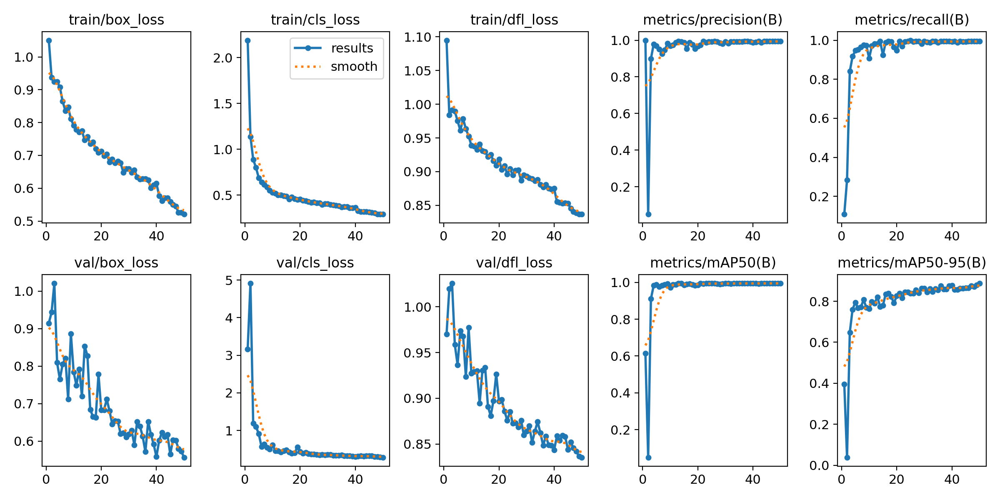

In [7]:
train_results = "/kaggle/working/runs/detect/train/results.png"

if os.path.exists(train_results):
    img = Image.open(train_results)  # Use PIL to read the image
    display(img)  # Display the image
else:
    print("Training results image not found.")



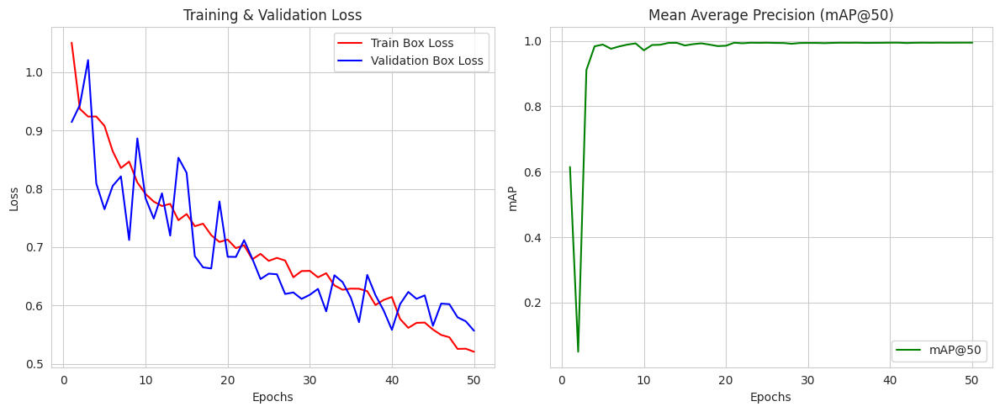

In [8]:
# Load the CSV
df = pd.read_csv("/kaggle/working/runs/detect/train/results.csv")

# Define the correct column names
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"
map_column = "metrics/mAP50(B)"

# Plotting
plt.figure(figsize=(12, 5))
sns.set_style("whitegrid")

# 📉 Train & Validation Loss
plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red")
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

# 🎯 mAP@50
plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green")
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP@50)")
plt.legend()

plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/number-plate-detection/images/N239.jpeg: 608x640 1 license_plate, 108.3ms
Speed: 3.4ms preprocess, 108.3ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 /kaggle/input/number-plate-detection/images/N169.jpeg: 416x640 1 license_plate, 98.1ms
Speed: 1.7ms preprocess, 98.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /kaggle/input/number-plate-detection/images/N18.jpeg: 448x640 1 license_plate, 97.4ms
Speed: 1.9ms preprocess, 97.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/input/number-plate-detection/images/N99.jpeg: 480x640 1 license_plate, 99.4ms
Speed: 1.8ms preprocess, 99.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/input/number-plate-detection/images/N116.jpeg: 384x640 1 license_plate, 71.9ms
Speed: 1.6ms preprocess, 71.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/input/

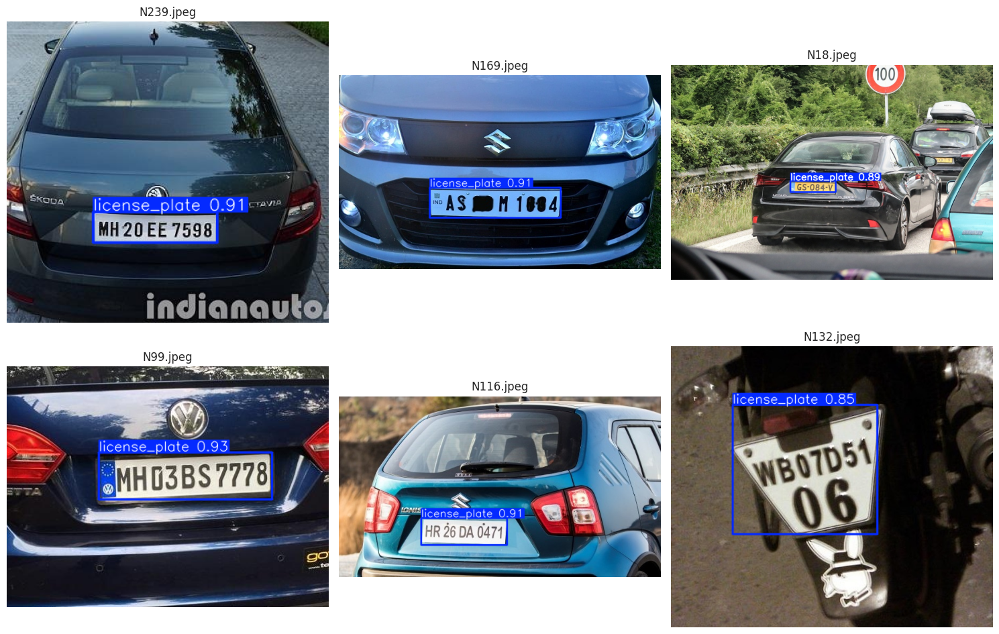

In [9]:

# Collect all images from the directory
all_images = glob.glob("/kaggle/input/number-plate-detection/images/*.jpeg")

# Randomly select 6 different images each time
test_images = random.sample(all_images, 6)

# Create a figure with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)      # Run YOLO on the image
    result_img = results[0].plot() # Get the annotated image
    
    # Convert the annotated image to RGB for plotting
    img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis("off")
    ax.set_title(os.path.basename(img_path))  # Show the image filename

plt.tight_layout()
plt.show()

In [10]:
# Load the trained YOLOv8 model
model_path = "/kaggle/working/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

# Define input and output video paths
input_video = "/kaggle/input/car-number-plate-video/Automatic Number Plate Recognition (ANPR) _ Vehicle Number Plate Recognition (1).mp4"
output_video = "/kaggle/working/output_video.mp4"
compressed_video = "/kaggle/working/output_video_compressed.mp4"  # Compressed version

# Open the input video file
cap = cv2.VideoCapture(input_video)

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

# Process video frame by frame
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv8 on the frame
    results = model(frame, verbose=False)  # No extra logs

    # Draw bounding boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            label = f"Plate {conf:.2f}"

            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write frame to output video
    out.write(frame)
    frame_count += 1

# Release video resources
cap.release()
out.release()
cv2.destroyAllWindows()
print(f"✅ Detection completed! Processed {frame_count} frames.")

# ✅ **Compress the video using FFmpeg**
print("⏳ Compressing video... (This may take a few seconds)")
ffmpeg_command = [
    "ffmpeg", "-i", output_video, "-vcodec", "libx264", "-crf", "28", "-preset", "fast", compressed_video
]
subprocess.run(ffmpeg_command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
print("✅ Compression done!")

# Function to display video in Jupyter Notebook (Kaggle Compatible)
from IPython.display import HTML
from base64 import b64encode

def play_video(file_path, width=800):
    """Display a video file directly in a Jupyter Notebook (Kaggle compatible)."""
    try:
        with open(file_path, "rb") as video_file:
            video_data = video_file.read()
            video_base64 = b64encode(video_data).decode()
    except FileNotFoundError:
        return HTML("<p style='color:red;'>🚨 Error: Video file not found!</p>")
    
    video_html = f"""
    <video width="{width}" controls autoplay loop>
        <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
        Your browser does not support the video tag.
    </video>
    """
    
    return HTML(video_html)

# Display the compressed video
play_video(compressed_video, width=1000)


✅ Detection completed! Processed 930 frames.
⏳ Compressing video... (This may take a few seconds)
✅ Compression done!


In [11]:
# === Test on a dataset of images ===
test_image_dir = "/kaggle/input/plates2/images/train"
output_dir = "/kaggle/working/predicted"
os.makedirs(output_dir, exist_ok=True)

image_paths = glob.glob(os.path.join(test_image_dir, "*.*"))
print(f"🖼️ Found {len(image_paths)} images to process.")

for idx, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    results = model(img, verbose=False)

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            label = f"Plate {conf:.2f}"

            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    output_path = os.path.join(output_dir, f"pred_{idx+1:04d}.jpg")
    cv2.imwrite(output_path, img)

print("✅ All test images processed.")


🖼️ Found 52 images to process.
✅ All test images processed.


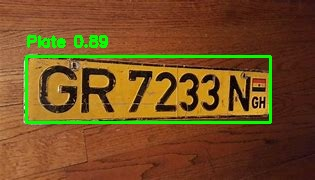

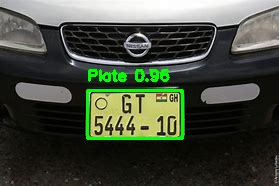

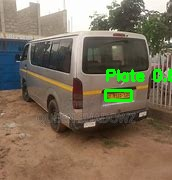

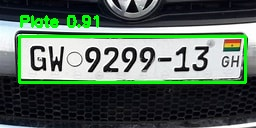

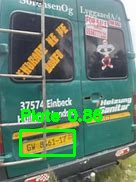

In [12]:
from IPython.display import Image, display

# Show first 5 predicted images
predicted_images = sorted(glob.glob(os.path.join(output_dir, "*.jpg")))
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))


-----------------